In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import holoviews as hv
import logomaker as lm
import matplotlib.pyplot as plt

import gpmap.src.plot as plot

from gpmap.src.genotypes import select_genotypes
from gpmap.src.space import SequenceSpace
from gpmap.src.randwalk import WMWSWalk

In [2]:
data = pd.read_csv('RA.vc.csv', dtype={'seq': str}).set_index('seq')
data

,RA
seq,
0100010010101101,0.396299
0100010010101100,0.377704
0100010010101111,0.369899
0100010010101110,0.397475
0100010010101001,0.065418
...,...
1011101101010110,0.505872
1011101101010001,0.385826
1011101101010000,0.469235


In [3]:
seq1 = 'TGGTTGTGGACGCTTT'.replace('T', 'U')
seq2 = 'ATCGCTAAACGATAAC'.replace('T', 'U')
pos = list(range(51, 57)) + list(range(58, 67)) + [76]
pos, seq1, seq2

([51, 52, 53, 54, 55, 56, 58, 59, 60, 61, 62, 63, 64, 65, 66, 76],
 'UGGUUGUGGACGCUUU',
 'AUCGCUAAACGAUAAC')

In [4]:
def translate_seq(seq, seq1, seq2):
    new_seq = ''
    for pos_allele, a1, a2 in zip(seq, seq1, seq2):
        if pos_allele == '0':
            new_seq += a1
        else:
            new_seq += a2
    return(new_seq)

In [5]:
data['nucleotide_seq'] = [translate_seq(seq, seq1, seq2)
                          for seq in data.index]
data.set_index('nucleotide_seq', inplace=True)
data

,RA
nucleotide_seq,
UUGUUUUGAAGGUAUC,0.396299
UUGUUUUGAAGGUAUU,0.377704
UUGUUUUGAAGGUAAC,0.369899
UUGUUUUGAAGGUAAU,0.397475
UUGUUUUGAAGGUUUC,0.065418
...,...
AGCGCGAAGCCACAAU,0.505872
AGCGCGAAGCCACUUC,0.385826
AGCGCGAAGCCACUUU,0.469235


In [33]:
space = SequenceSpace(X=data.index.values,
                      y=data['RA'].values)
rw = WMWSWalk(space)
rw.calc_visualization(mean_function=0.8, n_components=50)
ndf, edf = rw.nodes_df, space.get_edges_df()

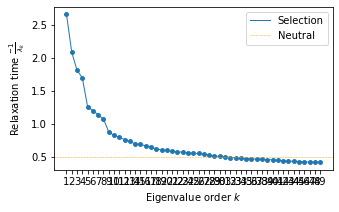

In [34]:
fig, axes = plt.subplots(1, 1, figsize=(5, 3))
plot.plot_relaxation_times(rw.decay_rates_df, axes, neutral_time=0.5)

In [8]:
ndf.to_csv('nodes_df.csv')
edf.to_csv('edges_df.csv')

In [9]:
ndf = pd.read_csv('nodes_df.csv', index_col=0)
edf = pd.read_csv('edges_df.csv', index_col=0)
ndf

,1,2,3,4,5,6,7,8,9,function,stationary_freq
UUGUUUUGAAGGUAUC,0.294727,1.869735,0.537480,-0.124205,0.084089,-0.225676,-0.388243,0.692010,0.376794,0.396299,6.202355e-06
UUGUUUUGAAGGUAUU,0.347880,1.910620,0.432544,-0.054020,0.035554,-0.151851,-0.353693,0.613084,0.323599,0.377704,5.456347e-06
UUGUUUUGAAGGUAAC,0.626428,1.795107,0.860697,-0.591674,0.428562,0.241183,-0.704551,1.712685,0.038933,0.369899,5.170588e-06
UUGUUUUGAAGGUAAU,0.670714,1.798517,0.849271,-0.598459,0.367920,0.287046,-0.685693,1.634973,0.015121,0.397475,6.252838e-06
UUGUUUUGAAGGUUUC,0.370459,1.405648,0.705775,-0.194415,-0.409183,-0.055003,-0.228759,0.067896,0.041062,0.065418,6.341767e-07
...,...,...,...,...,...,...,...,...,...,...,...
AGCGCGAAGCCACAAU,0.219709,0.201132,-0.525203,0.019871,1.686882,0.694700,0.364570,-0.351866,0.856487,0.505872,1.319822e-05
AGCGCGAAGCCACUUC,0.003043,-0.328420,-0.773103,-0.413485,0.850250,0.126346,0.607873,-0.271100,0.323834,0.385826,5.770453e-06
AGCGCGAAGCCACUUU,-0.010283,-0.415698,-0.876351,-0.389270,0.855762,0.112951,0.622600,-0.259947,0.316474,0.469235,1.025322e-05
AGCGCGAAGCCACUAC,0.138503,-0.193125,-0.499452,-0.298953,1.537429,0.602817,0.412619,-0.443148,0.661232,0.505358,1.315159e-05


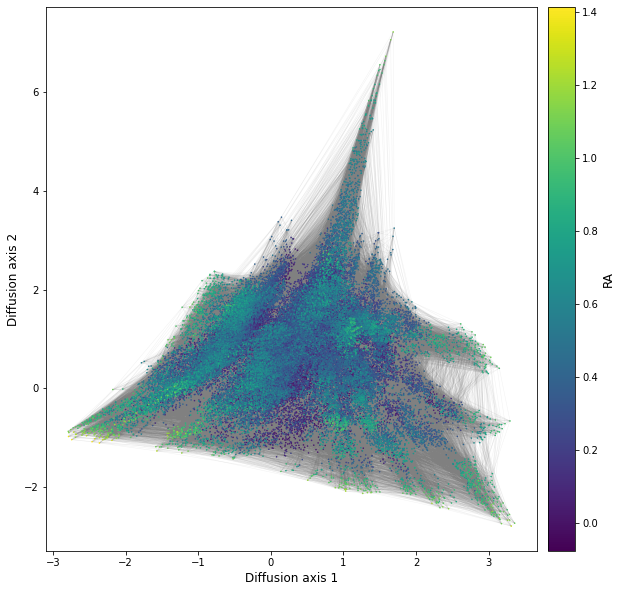

In [11]:
fig, axes = plt.subplots(1, 1, figsize=(10, 10))
plot.plot_visualization(axes, ndf, edges_df=edf, x='1', y='2',
                        ascending=True, nodes_cmap_label='RA',
                        edges_alpha=0.1)

In [18]:
top_seqs = ndf.sort_values('function', ascending=False).index[:10000]
sndf, sedf = select_genotypes(ndf, top_seqs, edges=edf)

In [30]:
plot.plot_interactive(sndf, edges_df=sedf, z='4', nodes_size=2.5)

[Text(0, 0.5, 'Frequency'), Text(0.5, 0, 'Position in Ribozyme')]

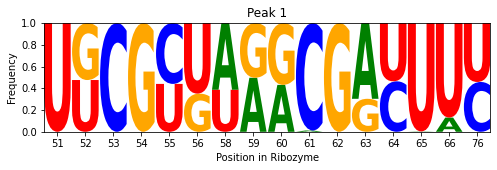

In [23]:
seqs = ndf.index[ndf['1'] < -2]
matrix = lm.alignment_to_matrix(seqs.values,
                                to_type='probability', pseudocount=0)
fig, axes = plt.subplots(1, 1, figsize=(8, 2))
lm.Logo(matrix, ax=axes)
axes.set_xticks(np.arange(16))
axes.set_xticklabels([str(x) for x in pos])
axes.set_title('Peak 1')
axes.set(ylabel='Frequency', xlabel='Position in Ribozyme')

[Text(0, 0.5, 'Frequency'), Text(0.5, 0, 'Position in Ribozyme')]

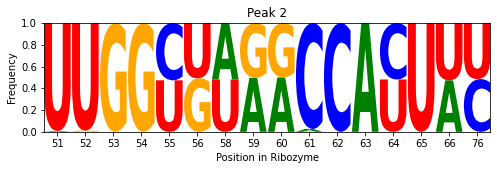

In [29]:
seqs = ndf.index[np.logical_and(ndf['1'] > 2.5, ndf['2'] < -1)]
matrix = lm.alignment_to_matrix(seqs.values,
                                to_type='probability', pseudocount=0)
fig, axes = plt.subplots(1, 1, figsize=(8, 2))
lm.Logo(matrix, ax=axes)
axes.set_xticks(np.arange(16))
axes.set_xticklabels([str(x) for x in pos])
axes.set_title('Peak 2')
axes.set(ylabel='Frequency', xlabel='Position in Ribozyme')

[Text(0, 0.5, 'Frequency'), Text(0.5, 0, 'Position in Ribozyme')]

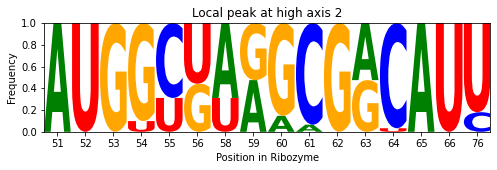

In [28]:
seqs = ndf.index[ndf['2'] > 5]
matrix = lm.alignment_to_matrix(seqs.values,
                                to_type='probability', pseudocount=0)
fig, axes = plt.subplots(1, 1, figsize=(8, 2))
lm.Logo(matrix, ax=axes)
axes.set_xticks(np.arange(16))
axes.set_xticklabels([str(x) for x in pos])
axes.set_title('Local peak at high axis 2')
axes.set(ylabel='Frequency', xlabel='Position in Ribozyme')